# 인물 모드 문제점 찾기
---

세그멘테이션을 활용하여 주어진 사진을 대상을 다양한 시도를 해보자.<br />
그리고 새로이 생성된 사진을 바탕으로 하여 세그멘테이션의 한계점을 탐색하고 이를 타계할 해결방안을 모색하여 보자.

## STEP 0. 설계
---

이번 프로젝트는 다음과 같은 순서로 진행 할 것이다.
1. 사진 수집 : PASCAL VOC 라벨로 구분 가능한 다양한 사진을 수집한다.
2. 세그멘테이션을 이용한 다양한 응용
    - 세그멘테이션을 활용하여 수집한 사진에서 객체와 배경의 영역을 분리한다.
    - 분리된 영역들을 활용하여 다양한 응용을 해보고, 결과물에서 문제점을 찾아본다.
        1. 아웃포커싱
        2. 배경 합성
3. 2에서 찾은 문제점을 바탕으로 세그멘테이션이 가지는 한계점을 파악하고 이에 대한 해결방안을 탐구하여 본다.

## STEP 1. 사진 수집
---

- 프로젝트에 사용하기 위해 다양한 사진을 수집하였고, workspace 하위의 `images` 디렉토리 하위에 모아두었다.
- `images` 하위에는 다시 이미지를 세부적으로 분류한 디렉토리가 존재하며, 각 디렉토리에 모인 이미지의 특징은 아래와 같다.
    - airplan : 비행기가 포함된 이미지
    - animals : 다양한 종의 동물이 포함된 이미지
    - background :합성에 배경으로 사용될 이미지
    - bird : 새가 포함된 이미지
    - living_room : 다양한 가구가 있는 거실 이미지
    - person : 사람이 포함된 이미지
    - road : 다양한 교통수단이 존재하는 도로 이미지

In [106]:
!ls -R ./images/

./images/:
airplan  animals  background  bird  living_room  person  road

./images/airplan:
01.png	02.png	03.png	04.png

./images/animals:
01.jpg	02.jpg	03.jpeg  04.jpg  05.jpg  06.jpg  07.jpeg  08.jpeg

./images/background:
beach.jpg  blue.jpeg  grass.jpg  grid.jpg

./images/bird:
01.jpeg  02.jpeg  03_angel.jpg

./images/living_room:
01.png	02.jpeg  03.jpeg  04.jpeg

./images/person:
01.jpg	02.jpg	03.jpg	04.jpeg  05.jpeg

./images/road:
01.jpeg  03.jpeg		    8239308689_efa6c11b08_z.jpg
02.jpeg  12283150_12d37e6389_z.jpg  8512296263_5fc5458e20_z.jpg
time: 148 ms (started: 2021-02-22 22:51:33 +09:00)


### 이미지 불러오기

- 디렉토리 하위의 이미지들을 불러와 dict 변수 imgs에 저장한다. 

In [110]:
dir_names = [os.path.basename(x) for x in glob(img_dir_path + '/*')]
imgs = { dir_name : [] for dir_name in dir_names }

time: 1 ms (started: 2021-02-22 22:58:48 +09:00)


In [111]:
# 각 하위 디렉토리 아래에 있는 이미지를 불러와 저장
for dir_name in dir_names:
    inner_dir_path = join(img_dir_path, dir_name)
    img_names = [os.path.basename(x) for x in glob(inner_dir_path + '/*')]
    img_names.sort()
    imgs[dir_name] = [ load_image(join(inner_dir_path, img_name)) 
                       for img_name in img_names ]

time: 393 ms (started: 2021-02-22 22:58:49 +09:00)


In [112]:
# 불러온 이미지 개수 확인
for dir_name in dir_names: print(f'len({dir_name})={len(imgs[dir_name])}')

len(bird)=3
len(airplan)=4
len(person)=5
len(animals)=8
len(background)=4
len(road)=6
len(living_room)=4
time: 2.81 ms (started: 2021-02-22 22:58:49 +09:00)


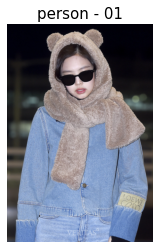

time: 143 ms (started: 2021-02-22 22:33:33 +09:00)


In [96]:
# 불러온 이미지 확인
plt.axis('off')
plt.imshow(cv2.cvtColor(imgs['person'][0], cv2.COLOR_BGR2RGB))
plt.title('person - 01', fontsize=15)
plt.show()

## STEP 2. 세그멘테이션을 이용한 다양한 응용
---

### segmentation model
- 이미지에서 객체를 인식해내는 것에 사용할 **DeepLab** segmentation 모델을 정의한다.

In [38]:
model = load_model(join(model_dir_path, 'deeplab_model.tar.gz'))

model loaded successfully!
time: 366 ms (started: 2021-02-22 21:51:37 +09:00)


#### 모델 동작 확인
- 사용된 함수 `get_seg_mask`는 deeplab model과 이미지를 입력받아, model이 이미지에 대한 segmentaion을 진행한다. 이후, segmentation으로 찾아낸 객체에 대한 mask를 생성하여 반환하게 된다.

[segmentation] segmentation - detecting all
[segmentation] segmentation result - pixel count
 >>> {'background(0)': 160018, 'bicycle(2)': 1195, 'chair(9)': 68, 'diningtable(11)': 4904, 'person(15)': 65178}

[segmentation] segmentation result - image


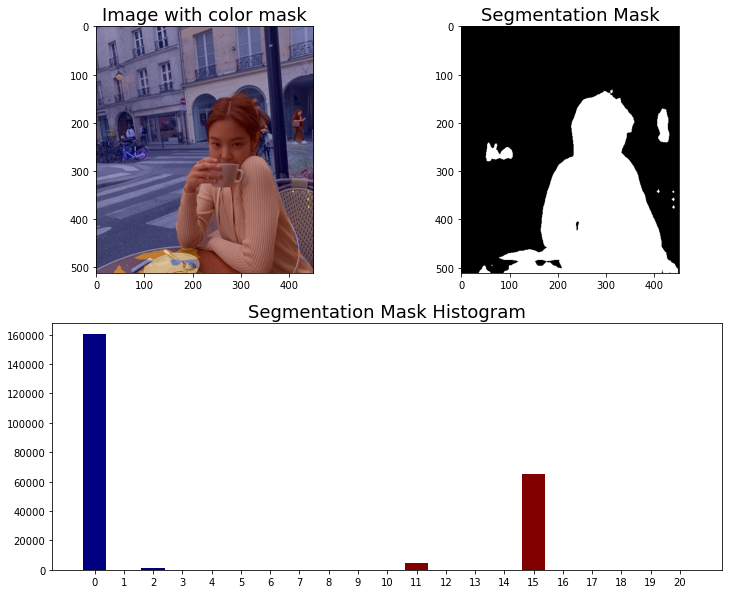

time: 3.69 s (started: 2021-02-22 21:51:39 +09:00)


In [39]:
seg_mask = get_seg_mask(model, imgs['person'][1])

- 위의 segmentation 결과를 보면, 주어진 이미지는 자전거/의자/테이블/사람이 존재함을 알 수 있다.
- 특정 label(=2, bicycle)만을 검출해 보기

[segmentation] segmentation - detecting ['bicycle']
[segmentation] segmentation result - pixel count
 >>> {'background(0)': 230168, 'bicycle(2)': 1195}

[segmentation] segmentation result - image


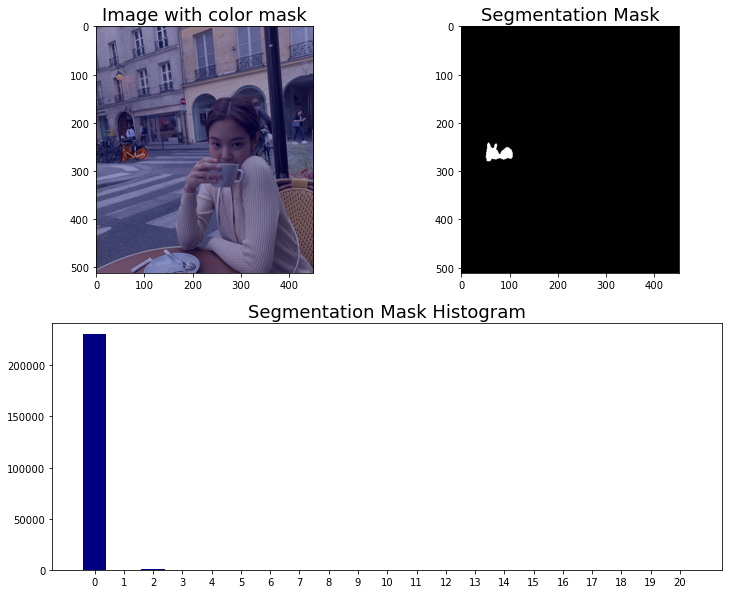

time: 451 ms (started: 2021-02-22 21:51:45 +09:00)


In [40]:
seg_mask_biycle_only = get_seg_mask(model, imgs['person'][1], targets=[2])

### 아웃포커싱

- 이미지에서 객체를 찾아낸 후, 배경을 흐리게 만드는 아웃포커싱을 진행해 보자.
- Code Collection에 정의되어 있는 `get_shallow_focused_img`를 이용한다.

1. `get_shallow_focused_img`
    - parameters
        - model : 위에서 정의한 deeplab segmentation model
        - img_orig : 아웃포커싱을 진행할 대상 이미지
        - seg_mask=None : sementation의 결과로 얻어진 필터링 mask, 만약 입력이 없다면 함수 내부에서 mask를 생성한다.
        - targets=[] : 아웃포커싱 되지 않을(=블러처리가 되지 않을) 객체의 label
            - 빈 배열이 입력 된다면, 모든 label이 입력된 것과 같이 취급한다.
        - verbose=2 : 값이 높을수록 함수의 실행단계별 결과를 더 많이 출력한다. 범위 : 0~2
        

2. `get_shallow_focused_img` 동작확인 - 1
    - 이미지에서 모든 객체(label > 0)를 제외한 곳을 대상으로 아웃포커싱을 진행해 보자.

[segmentation] segmentation - detecting all
[segmentation] segmentation result - pixel count
 >>> {'background(0)': 160018, 'bicycle(2)': 1195, 'chair(9)': 68, 'diningtable(11)': 4904, 'person(15)': 65178}

[segmentation] segmentation result - image


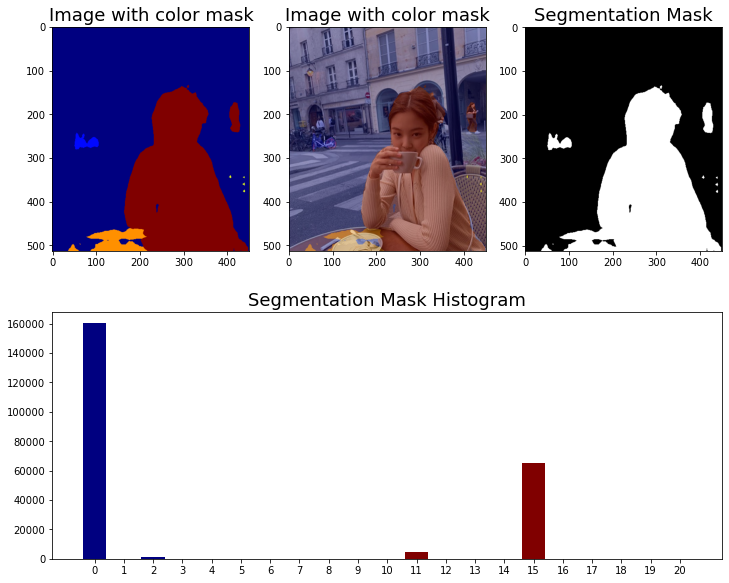


[shallow focusing] result


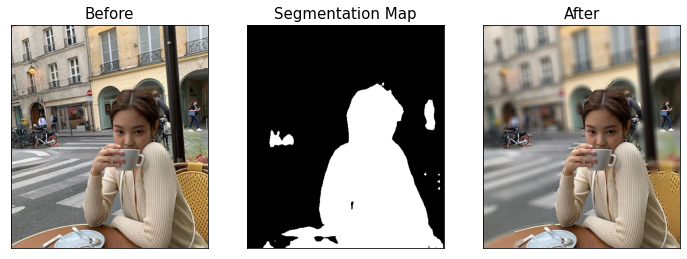

time: 774 ms (started: 2021-02-22 22:03:29 +09:00)


In [59]:
_ = get_shallow_focused_img(model, imgs['person'][1], targets=[], verbose=2)

3. `get_shallow_focused_img` 동작확인 - 2
    - 이미지에서 사람(label num=15)을 제외한 부분에 아웃포커싱을 적용시켜 본다.

In [43]:
outfocused_imgs = {}

time: 316 µs (started: 2021-02-22 21:52:06 +09:00)



[shallow focusing] result


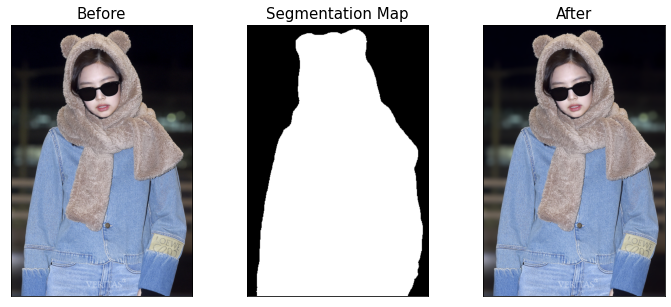


[shallow focusing] result


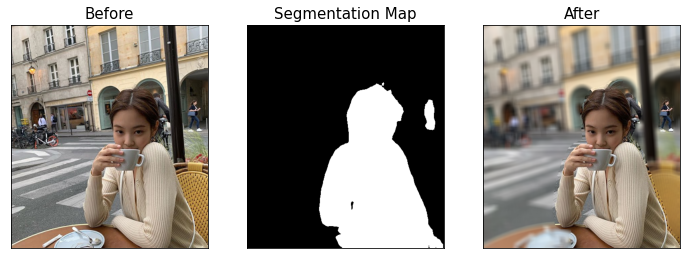


[shallow focusing] result


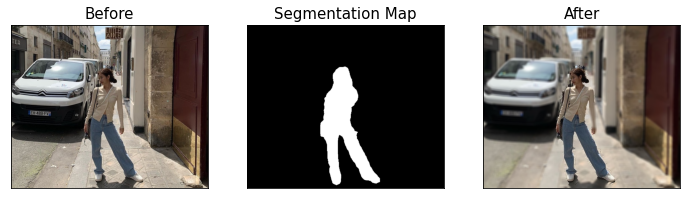


[shallow focusing] result


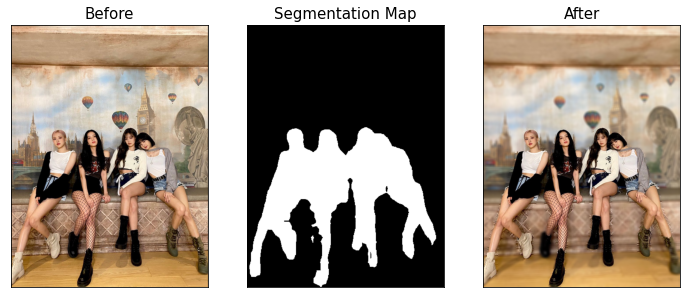


[shallow focusing] result


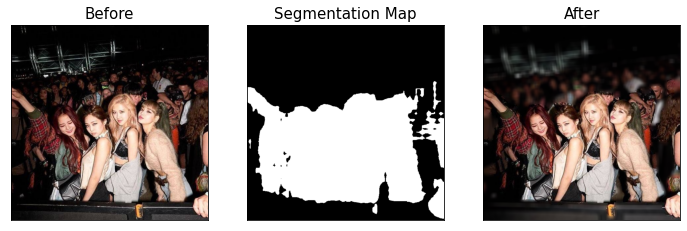

time: 1.59 s (started: 2021-02-22 21:56:28 +09:00)


In [52]:
outfocused_imgs['person'] = [ get_shallow_focused_img(model, img, targets=[15], verbose=1) 
                              for img in imgs['person']]

4. 다양한 이미지에 대하여 segmentation을 진행하고, 배경을 블러처리 해보자.

- imgs.airplan


[shallow focusing] result


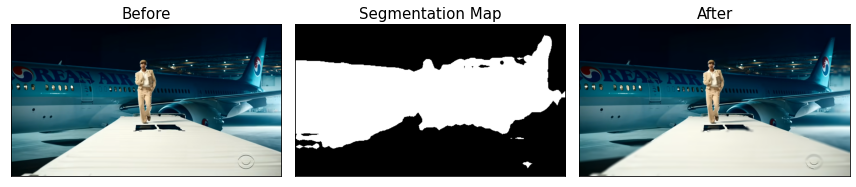


[shallow focusing] result


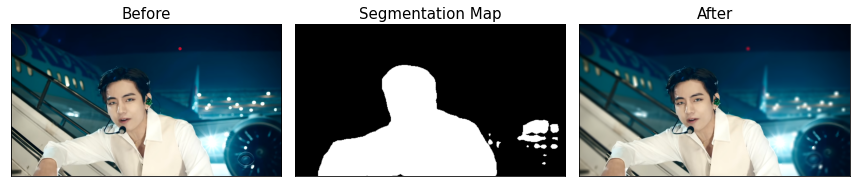


[shallow focusing] result


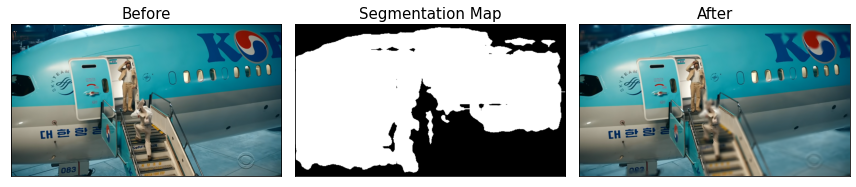


[shallow focusing] result


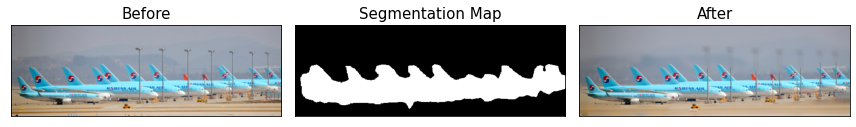

time: 1.42 s (started: 2021-02-22 22:05:27 +09:00)


In [61]:
outfocused_imgs['airplan'] = [ get_shallow_focused_img(model, img, targets=[], verbose=1) 
                              for img in imgs['airplan']]

- imgs.living_room


[shallow focusing] result


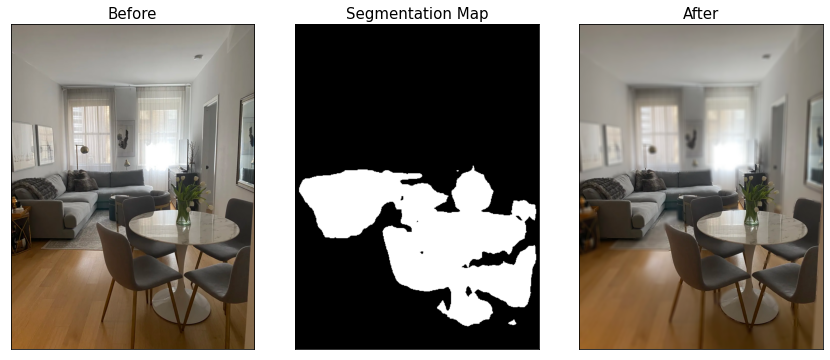


[shallow focusing] result


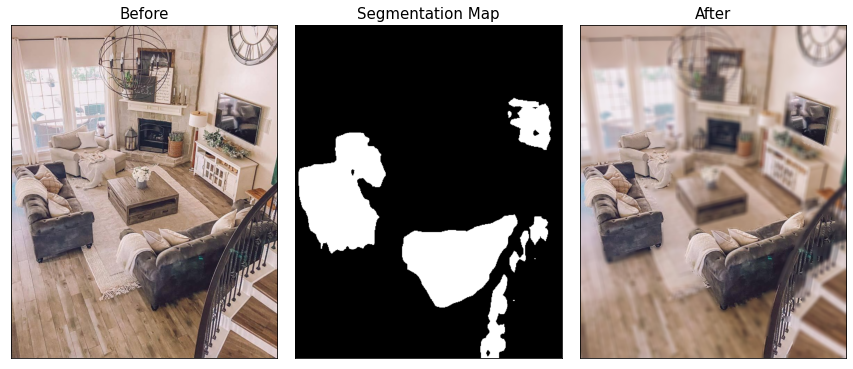


[shallow focusing] result


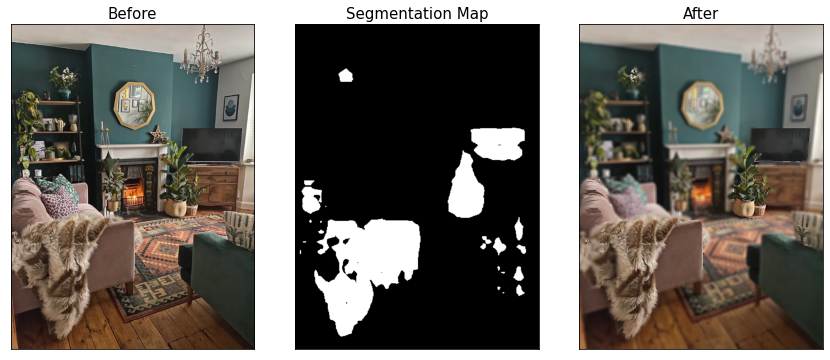


[shallow focusing] result


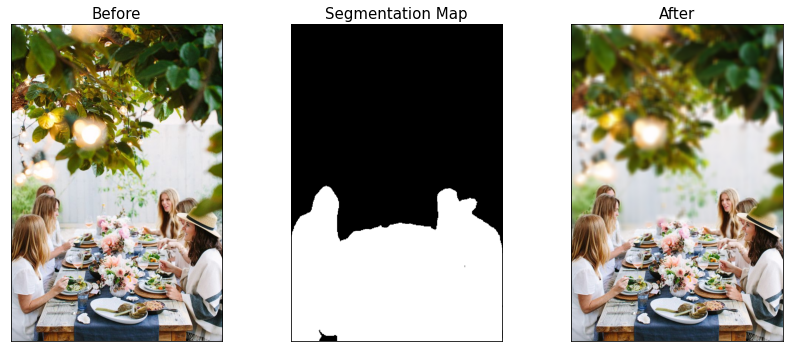

time: 1.84 s (started: 2021-02-22 22:05:31 +09:00)


In [62]:
outfocused_imgs['living_room'] = [ get_shallow_focused_img(model, img, targets=[], verbose=1) 
                              for img in imgs['living_room']]

- imgs.road

/home/aiffel-dj1/anaconda3/envs/aiffel/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in long_scalars
/home/aiffel-dj1/anaconda3/envs/aiffel/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in multiply



[shallow focusing] result


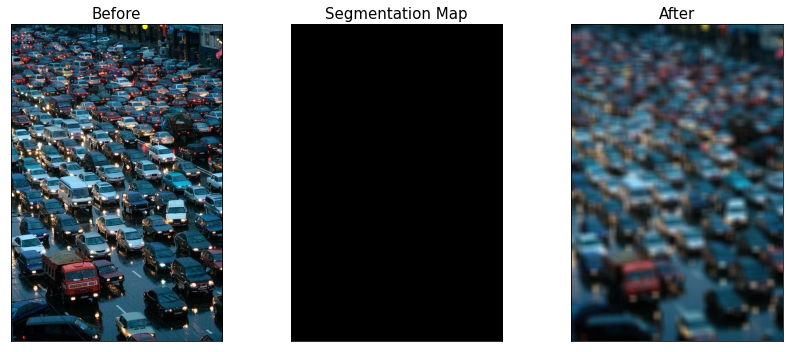


[shallow focusing] result


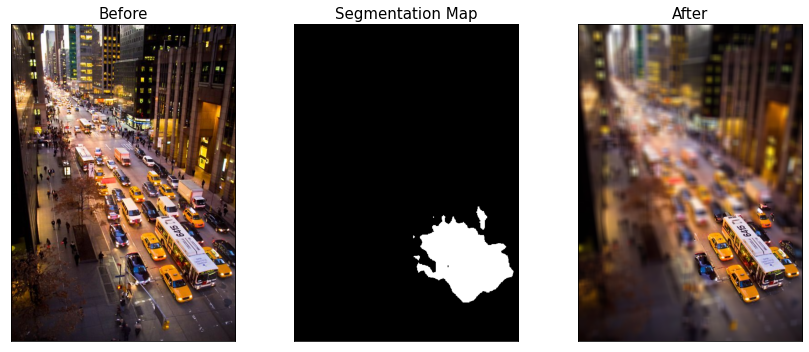


[shallow focusing] result


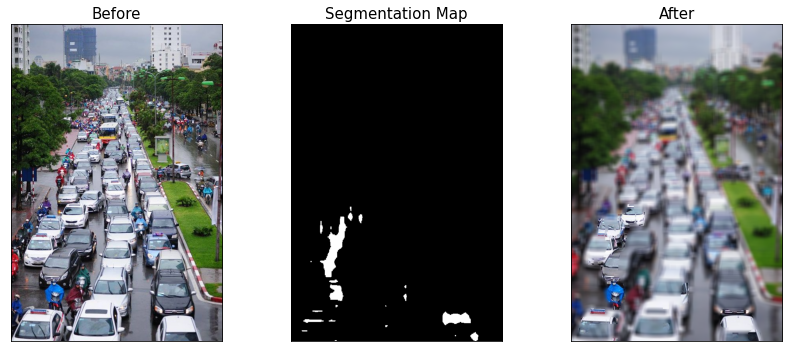


[shallow focusing] result


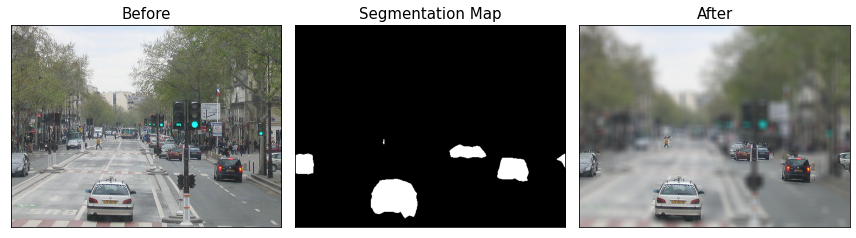


[shallow focusing] result


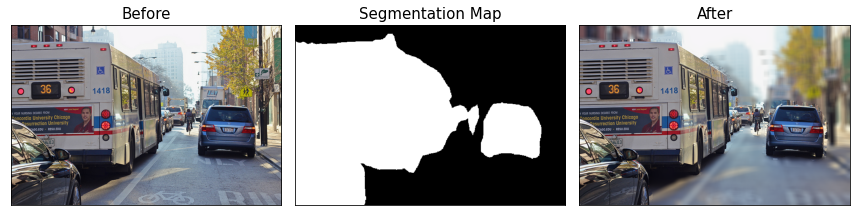


[shallow focusing] result


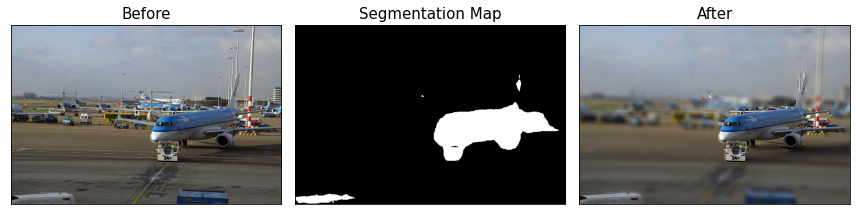

time: 1.76 s (started: 2021-02-22 22:05:44 +09:00)


In [64]:
outfocused_imgs['road'] = [ get_shallow_focused_img(model, img, targets=[], verbose=1) 
                              for img in imgs['road']]

### 배경 합성

- 이미지에서 객체를 찾아낸 후, 배경을 찾아내어 다른 사진으로 교체하는 작업을 진행하여 보자.
- Code Collection에 정의되어 있는 `change_background`를 이용한다.

1. `change_backgound`
    - parameters
        - model: 위에서 정의한 deeplab segmentation model
        - img_orig: 배경 교체를 진행할 대상 이미지
        - img_bg: img_orig의 배경으로 합성될 대상 이미지
        - seg_mask=None: sementation의 결과로 얻어진 필터링 mask, 만약 입력이 없다면 함수 내부에서 mask를 생성한다.
        - targets=[]: 배경으로 처리 되지 않을(=블러처리가 되지 않을) 객체의 label
            - 빈 배열이 입력 된다면, 모든 label이 입력된 것과 같이 취급한다.
            - 예를 들어, img_orig이 강아지와 사람이 있는 이미지일 때, targets=[15]라면 강아지는 배경으로 취급되어 결과 이미지에서는 사라지게 될 것이다.
        - verbose=2        

2. `change_backgound` 동작확인 - 1
    - 이미지에서 모든 객체(label > 0)를 유지한 상태로 배경을 교체해 본다.

[segmentation] segmentation - detecting all
[segmentation] segmentation result - pixel count
 >>> {'background(0)': 160018, 'bicycle(2)': 1195, 'chair(9)': 68, 'diningtable(11)': 4904, 'person(15)': 65178}

[segmentation] segmentation result - image


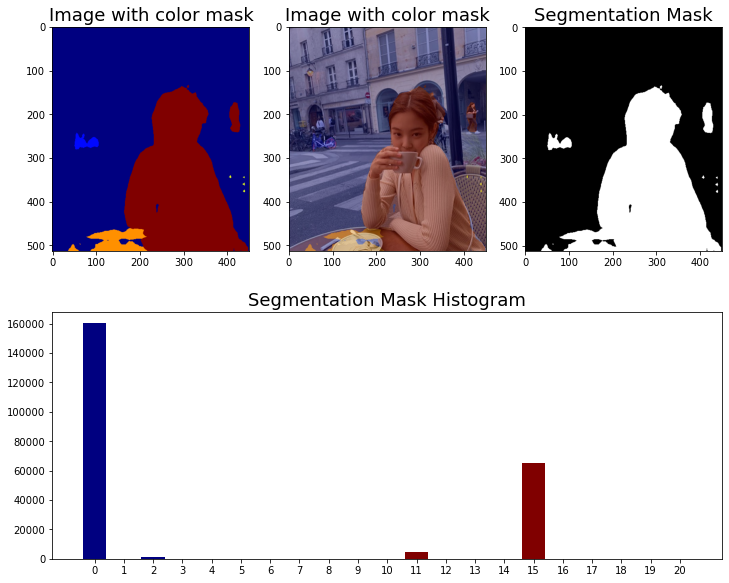

[change_background] foreground.shape : (512, 451, 3) → (512, 451, 3)
[change_background] background.shape : (900, 1600, 3) → (900, 1600, 3)
[change_background] mask.shape : (512, 451) → (512, 451)
[change_background] result.shape : (512, 451, 3)



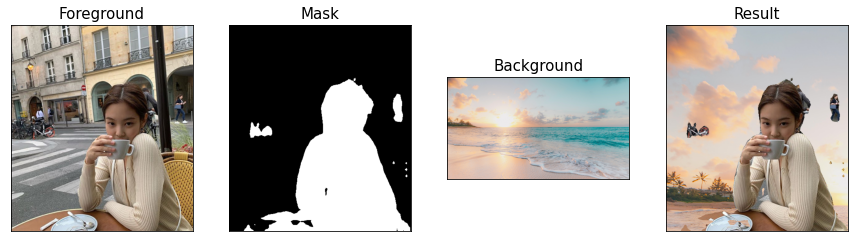

time: 927 ms (started: 2021-02-22 22:16:29 +09:00)


In [80]:
_ = change_background(model, imgs['person'][1], imgs['background'][0], 
                    targets=[], verbose=2)

3. `change_backgound` 동작확인 - 2
    - 이미지에서 사람(label num=15)을 제외한 부분을 다른 사진으로 교체한다.

In [81]:
bg_changed_imgs = {}
bg_len = len(imgs['background'])

time: 506 µs (started: 2021-02-22 22:25:51 +09:00)


In [85]:
def get_rand_bg():
    return imgs['background'][np.random.randint(bg_len)]

time: 490 µs (started: 2021-02-22 22:27:30 +09:00)


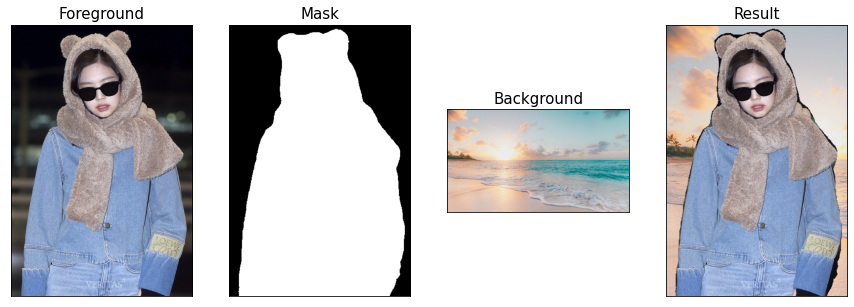

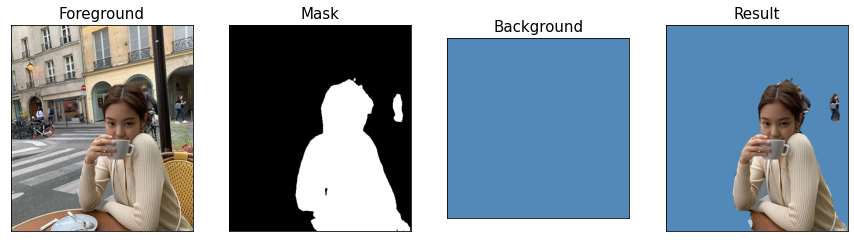

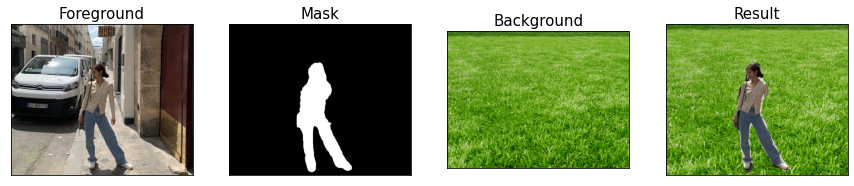

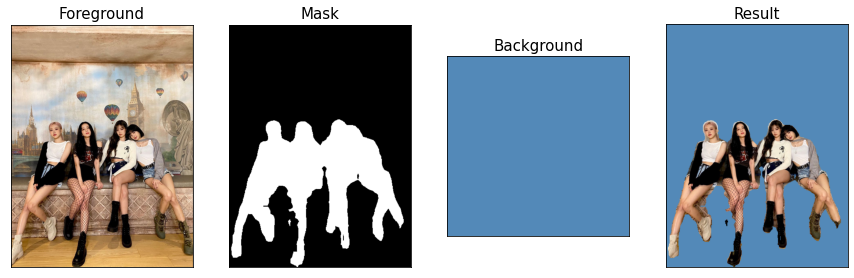

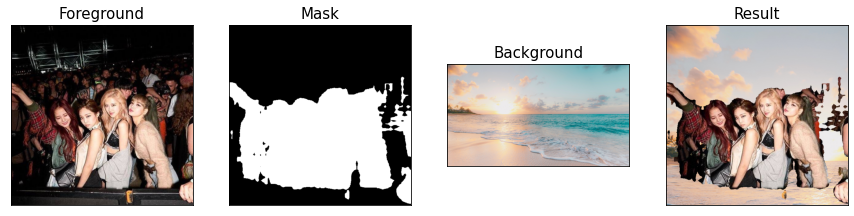

time: 2.09 s (started: 2021-02-22 23:02:18 +09:00)


In [118]:
bg_changed_imgs['person'] = [ change_background(model, 
                                                img, 
                                                get_rand_bg(),
                                                targets=[15], verbose=1) 
                              for img in imgs['person']]

4. 다양한 이미지에 대하여 segmentation을 진행하고, 배경을 변경하여 보자.

- imgs.animals

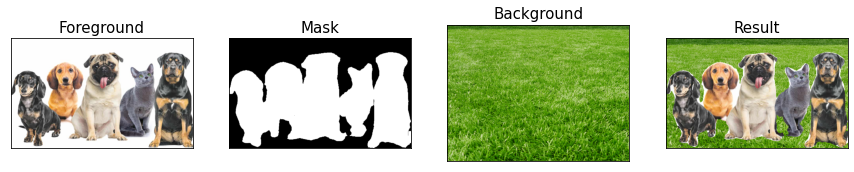

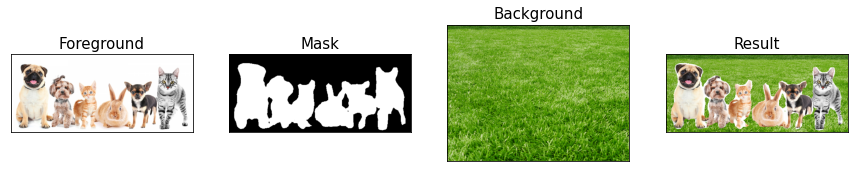

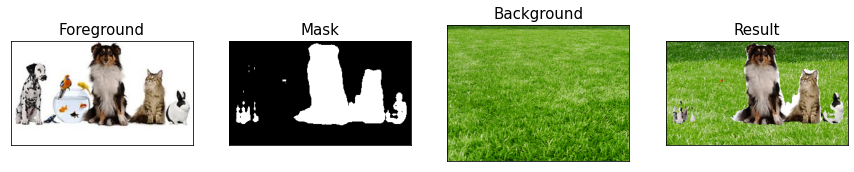

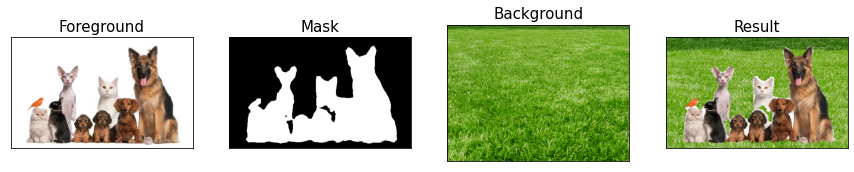

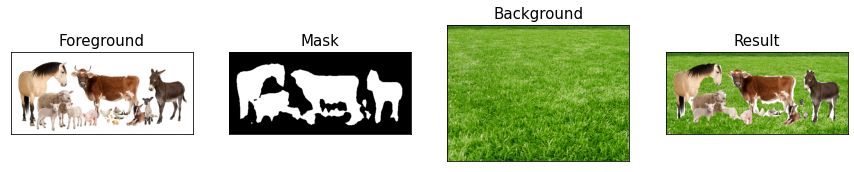

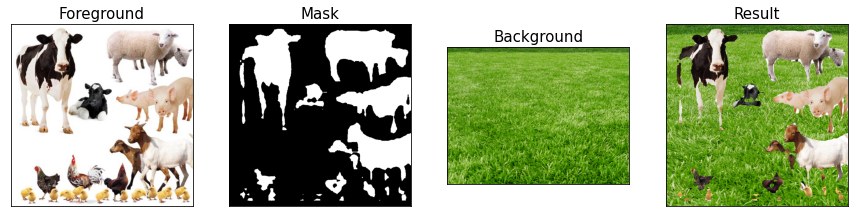

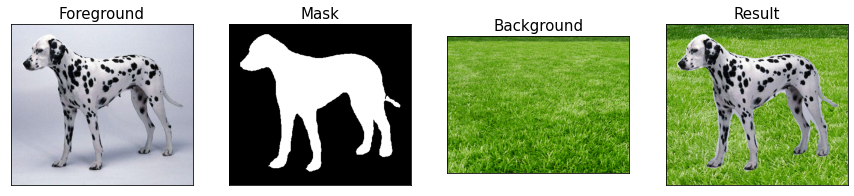

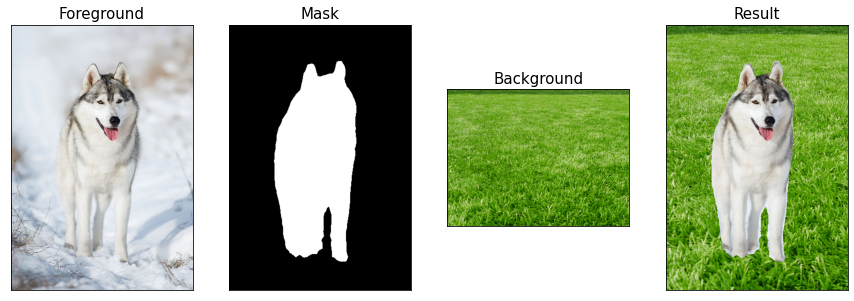

time: 2.96 s (started: 2021-02-22 22:33:44 +09:00)


In [97]:
bg_changed_imgs['animals'] = [ change_background(model, 
                                                img, 
                                                imgs['background'][2],
                                                targets=[], verbose=1) 
                              for img in imgs['animals']]

- imgs.bird

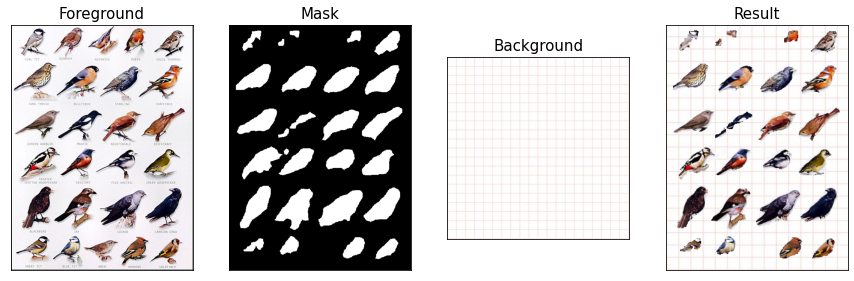

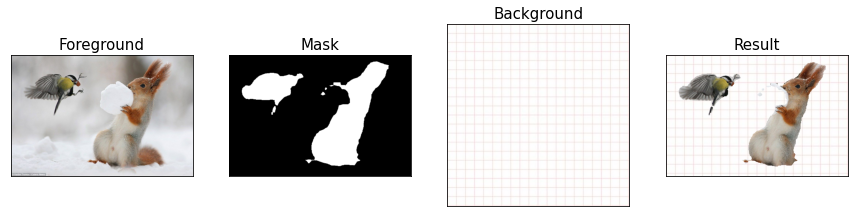

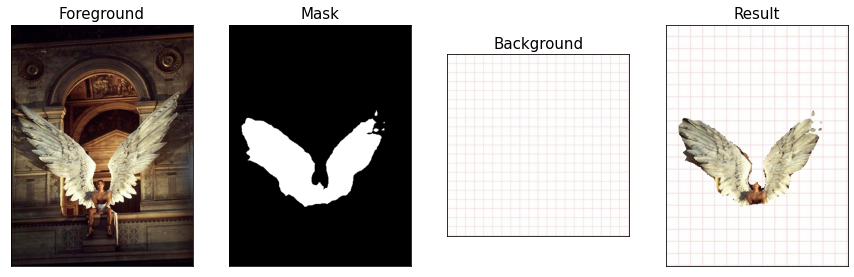

time: 1.13 s (started: 2021-02-22 23:00:27 +09:00)


In [117]:
bg_changed_imgs['bird'] = [ change_background(model, 
                                                img, 
                                                imgs['background'][3],
                                                targets=[], verbose=1) 
                              for img in imgs['bird']]

## STEP 3. 탐구
---

### 문제 사항
1. 객체 인식을 실패함 : 아래와 같이 sementation에 완전히 실패하여, segmentation map의 값이 모두 0인 경우가 발생하였다.

/home/aiffel-dj1/anaconda3/envs/aiffel/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: divide by zero encountered in long_scalars
/home/aiffel-dj1/anaconda3/envs/aiffel/lib/python3.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in multiply


[segmentation] segmentation - detecting all
[segmentation] segmentation result - pixel count
 >>> {'background(0)': 175446}

[segmentation] segmentation result - image


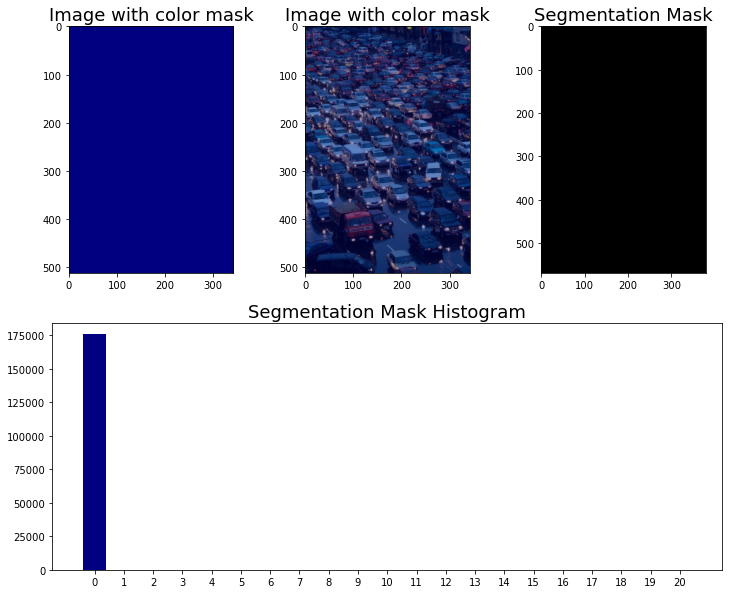

time: 553 ms (started: 2021-02-22 23:13:26 +09:00)


In [123]:
_ = get_seg_mask(model, imgs['road'][0])

2. 객체의 인식을 부분적으로 실패함
    - segmentation을 진행하여 객체를 찾기는 하였으나, 완벽하게 인식되었다고 판단하기 어려운 사례들을 확인할 수 있었다.
    - 아래의 예시에서는 왼편 상단의 소의 뒷다리가 인식되지 못하고 배경으로 취급되었다.
    - 그리고 소의 머리 부분은 양으로, 소의 몸통 부분을 소로 labeling 되었다.

[segmentation] segmentation - detecting all
[segmentation] segmentation result - pixel count
 >>> {'background(0)': 187907, 'cow(10)': 4860, 'dog(12)': 9266, 'sheep(17)': 61136}

[segmentation] segmentation result - image


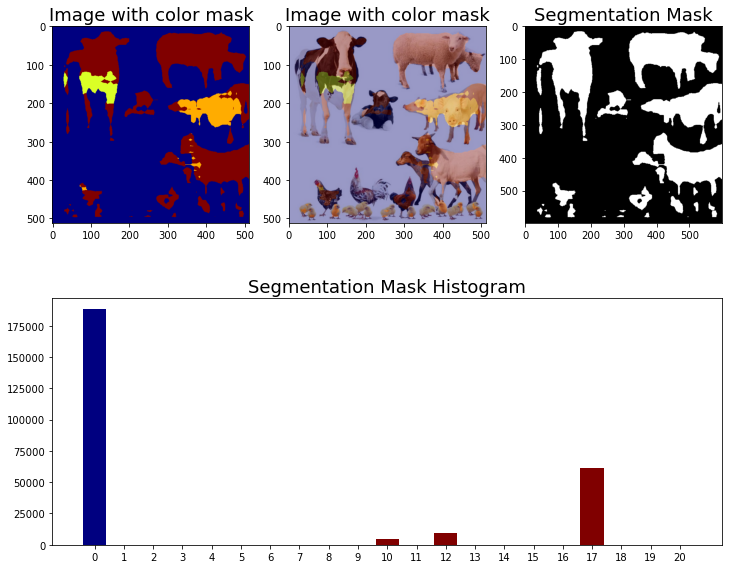

time: 578 ms (started: 2021-02-22 23:13:12 +09:00)


In [122]:
_ = get_seg_mask(model, imgs['animals'][5])

3. 예측된 라벨이 틀림 : segmentation map에 예측된 라벨이 실제 데이터가 가져야하는 라벨가 다른 경우를 확인할 수 있었다. 아래의 경우, 오른쪽 두번째에 있는 고양이를 강아지로 인식하였다.

[segmentation] segmentation - detecting all
[segmentation] segmentation result - pixel count
 >>> {'background(0)': 63977, 'cat(8)': 30, 'dog(12)': 93484}

[segmentation] segmentation result - image


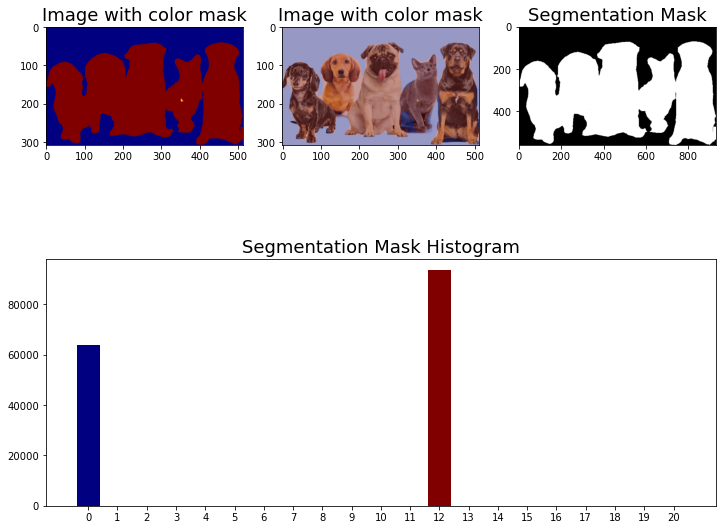

time: 559 ms (started: 2021-02-22 23:22:31 +09:00)


In [135]:
_ = get_seg_mask(model, imgs['animals'][0])

4. 라벨에 존재하지 않은 객체를 인식함 : 라벨에 존재하는 않는 객체를 인식하여 객체와 유사한 라벨을 할당하는 현상을 확인할 수 있었다.
    - 첫번째 예시에서는 오른편의 다람쥐를 새로 인식하였다.
    - 두번째 에시에서는 중앙에 위차한 토끼를 강아지로 인식하였다.

[segmentation] segmentation - detecting all
[segmentation] segmentation result - pixel count
 >>> {'background(0)': 138935, 'bird(3)': 35998}

[segmentation] segmentation result - image


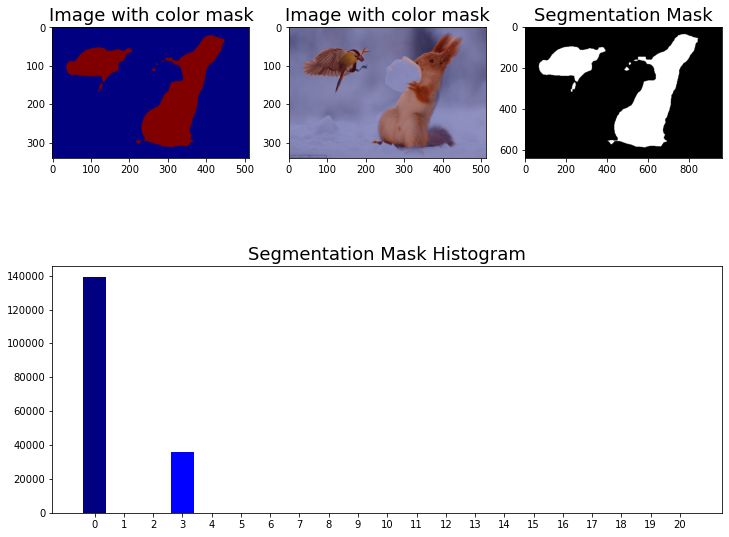

time: 547 ms (started: 2021-02-22 23:22:46 +09:00)


In [136]:
_ = get_seg_mask(model, imgs['bird'][1])

[segmentation] segmentation - detecting all
[segmentation] segmentation result - pixel count
 >>> {'background(0)': 60683, 'cat(8)': 9205, 'dog(12)': 41946}

[segmentation] segmentation result - image


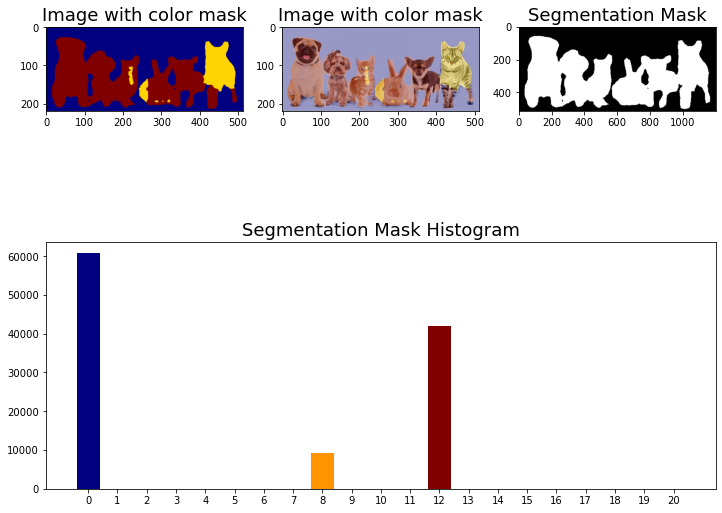

time: 714 ms (started: 2021-02-22 23:23:17 +09:00)


In [138]:
_ = get_seg_mask(model, imgs['animals'][1])

### 해결방안
- 위에서 발견한 문제는 1) 객체 경계의 모호함 2) 라벨링 실패-두 가지로 요약 할 수 있다.
- 먼저 객체의 경계가 모호한 것은 depth 정보를 학습 데이터에 추가함으로 해결 할 수 있을 것이다. depth image는 이용한다면 이미지에서 객체의 경계를 구분하는 능력이 향상 되므로 첫번째 문제의 해결 방안이 될 수 있다. 이는 sementic segmentation 뿐만아니라 instance segmentation에도 적용해 볼만한 솔루션이라 생각된다.
- 또 다른 해결방안은 모델에 더 많은 학습 데이터를 제공하는 것이 있을 수 있을 것이다.

## 결론
---

### 프로젝트 평가
1. 인물모드 사진을 성공적으로 제작하였다. 아웃포커싱 효과가 적용된 본인의 인물모드 사진과 고양이 사진, 배경전환 크로마키사진을 각각 1장 이상 성공적으로 제작하였다.
2. 제작한 인물모드 사진들에서 나타나는 문제점을 정확히 지적하였다. 인물사진에서 발생한 문제점을 정확히 지적한 사진을 제출하였다.
3. 인물모드 사진의 문제점을 개선할 수 있는 솔루션을 적절히 제시하였다. 추가적인 depth 정보를 활용하여 semantic segmentation mask의 오류를 보완할 수 있는 좋은 솔루션을 구체적으로 제시하였다.

### 회고
- sementic segmentation이 개념이 처음에 잘 와닿지 않아 시간을 많이 소모하였다. 이전까지 다루었던 cnn 모델은 image classification 모델들로 이미지를 인식하여 클래스로 분류하는 것들이었다. 큰 사이즈의 이미지를 convolution/pooling/fully connected layer에 통과시켜 하나의 클래스 값으로 출력하는 일련의 작업이 그에 해당된다.

<figure>
    <img src="./assets/ss_1_cnn_basic.png" title="cnn model basic form - image classification지">    
    <figcaption>cnn model basic form - image classification</figcaption>
</figure>

- 하지만, sementic segmentation의 input size와 output size가 동일해야하기 때문에 시작부터 기존에 알던 방식과 달라 어떻게 된거지?-하는 의문이 들었었다. 이를 이해해보기 위하여 노드에 삽입된 외부문서를 통하여 DeepLab에 관한 정보를 읽어보았지만 잘 이해되지 않아 프로젝트 진행이 더뎌졌었다. 이 고비가 해결된 것은 sementic segmentation 자체의 원리를 검색하던 중 FCN에 대한 정보를 알게 된 이후이다. FCN은 sementic segmentation을 수행하는 초기 모델로 이후에 등장한 모델들은 이를 조금씩 변형/발전 시킨 것이라고 할 수 있다. 
- FCN 모델은 먼저 기존 cnn 모델의 FC layer를 1x1 convolution layer로 변경 시킴으로써 input/output size에 제한을 없앴다.
<figure>
    <img src="./assets/ss_2_fc_2_cl.png" title="">    
    <figcaption>FCN basic form</figcaption>
</figure>

- 이후의 단계들은 classification과 유사하게 진행된다. 입력 이미지가 네트워크를 거치게 되면 일정 크기의 feature map에 도달하게 되고 이는 입력 입력 이미지의 위치 정보를 대략적으로 유지하고 있다. featrue map은 훈련된 클래스와 같은 갯수를 가지면 하나의 특성맵은 하나의 클래스를 가진다. 즉, 사람에 대한 특성맵이라면, 특성맵상에서 사람이 있을 위치의  픽셀의 값이 높게 나타날 것이다. 다음단계로는 특성맵을 다시 원래의 이미지 크기로 upsampling을 해주고 특성 맵들을 종합하여 segmentation map을 생성하게 된다.
<figure>
    <img src="./assets/ss_3_heatmap.jpeg" title="">    
    <figcaption>FCN basic form</figcaption>
</figure>
- 이와같은 sementic segmentation의 기본 사항을 알게되니 프로젝트를 더 수월하게 진행할 수 있었다. 이후 프로젝트에서도 기본적인 개념은 꼭 챙겨가야겠다는 생각이 들었다.

### 추가 학습 사항
- FCN 동작방식

## Code Collection
---

#### environment setting
- import packages
- set directory path
- load extensor to measure cell running time
- initialization gpu
- assign LABEL_NAMES

In [24]:
# import packages ########################################################
import cv2
import numpy as np
import os
from glob import glob
from os.path import join
import tarfile
import urllib # urllib 패키지는 웹에서 데이터를 다운로드 받을 때 사용
from matplotlib import pyplot as plt
import tensorflow as tf


# load extensor to measure cell running time ###############################
%load_ext autotime


# set directory path# #######################################################
workspace_path = os.getenv('HOME')+'/workspace/aiffel-exploration-workspace/E10_semantic_segmentation'
img_dir_path = workspace_path + '/images'
model_dir_path = workspace_path + '/models'


# initialization gpu ########################################################
def init_gpu():
    gpus = tf.config.experimental.list_physical_devices('GPU')
    if gpus:
      try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
          tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs\n\n")
      except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e, "\n\n")
        
init_gpu()

# assign LABEL_NAMES ########################################################
LABEL_NAMES = [
    'background', 'airplan', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]

The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
1 Physical GPUs, 1 Logical GPUs


time: 2.03 ms (started: 2021-02-22 21:51:14 +09:00)


#### DeepLabModel

In [25]:
class DeepLabModel():
    INPUT_TENSOR_NAME = 'ImageTensor:0'
    OUTPUT_TENSOR_NAME = 'SemanticPredictions:0'
    INPUT_SIZE = 513
    FROZEN_GRAPH_NAME = 'frozen_inference_graph'

    # __init__()에서 모델 구조를 직접 구현하는 대신, tar file에서 읽어들인 그래프구조 graph_def를 
    # tf.compat.v1.import_graph_def를 통해 불러들여 활용하게 됩니다. 
    def __init__(self, tarball_path):
        self.graph = tf.Graph()
        graph_def = None
        tar_file = tarfile.open(tarball_path)
        for tar_info in tar_file.getmembers():
            if self.FROZEN_GRAPH_NAME in os.path.basename(tar_info.name):
                file_handle = tar_file.extractfile(tar_info)
                graph_def = tf.compat.v1.GraphDef.FromString(file_handle.read())
                break
        tar_file.close()

        with self.graph.as_default():
    	    tf.compat.v1.import_graph_def(graph_def, name='')

        self.sess = tf.compat.v1.Session(graph=self.graph)

    # 이미지를 전처리하여 Tensorflow 입력으로 사용 가능한 shape의 Numpy Array로 변환합니다.
    def preprocess(self, img_orig):
        height, width = img_orig.shape[:2]
        resize_ratio = 1.0 * self.INPUT_SIZE / max(width, height)
        target_size = (int(resize_ratio * width), int(resize_ratio * height))
        resized_image = cv2.resize(img_orig, target_size)
        resized_rgb = cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB)
        img_input = resized_rgb
        return img_input
        
    def run(self, image):
        img_input = self.preprocess(image)

        # Tensorflow V1에서는 model(input) 방식이 아니라 sess.run(feed_dict={input...}) 방식을 활용합니다.
        batch_seg_map = self.sess.run(
            self.OUTPUT_TENSOR_NAME,
            feed_dict={self.INPUT_TENSOR_NAME: [img_input]})

        seg_map = batch_seg_map[0]
        return cv2.cvtColor(img_input, cv2.COLOR_RGB2BGR), seg_map

time: 2.15 ms (started: 2021-02-22 21:51:15 +09:00)


#### load model

In [26]:
def load_model(weight_path):
    model = DeepLabModel(weight_path)
    print('model loaded successfully!')
    return model

time: 1.19 ms (started: 2021-02-22 21:51:16 +09:00)


#### load image

In [27]:
def load_image(img_path: str):
    img = cv2.imread(img_path) 
    return img

time: 430 µs (started: 2021-02-22 21:51:16 +09:00)


#### get segmentation mask

In [28]:
def cstm(cm_name, x):
    return plt.get_cmap(cm_name)((np.clip(x,2,10)-2)/8.)

time: 1.11 ms (started: 2021-02-22 21:51:16 +09:00)


In [58]:
def get_seg_mask(model, img_orig, targets=[], verbose=2):
    """
    segmentation 결과 생성된 mask와 결과를 덮입힌 이미지를 반환합니다.
    
    Args:
        model (DeepLabModel)
        img_orig (ndarray): segmentation을 진행할 대상 이미지
        targets (list)
            - segmentation의 결과에서 관심 있는 label들의 모음
            - len(targets) == 0 : 배경을 제외한 모든 것을 검출
            - len(targets) > 0 : 리스트에 속한 라벨만을 검출
        
    Returns:
        seg_mask_up: segmentation의 결과로 만들어진 mask
    """
    
    # run model
    img_resized, seg_map = model.run(img_orig)
        
    if len(targets) > 0: # targets에 속한 라벨만을 검출
        seg_map = np.where(np.isin(seg_map, targets), seg_map, 0)
    
    seg_mask = seg_map * (255/seg_map.max()) # 255 normalization
    seg_mask = seg_mask.astype(np.uint8)
    seg_mask_up = cv2.resize(seg_mask,
                             img_orig.shape[:2][::-1],
                             interpolation=cv2.INTER_LINEAR)
    
    _, seg_mask_up = cv2.threshold(seg_mask_up, 5, 255, cv2.THRESH_BINARY)

    if verbose > 1 :
        
        print(f'[segmentation] segmentation - detecting {"all" if len(targets) == 0 else [LABEL_NAMES[t] for t in targets]}')
        unique, counts = np.unique(seg_map, return_counts=True)
        seg_map_counts = dict(zip(unique, counts))
        seg_map_counts = { f'{LABEL_NAMES[l]}({l})' : n for l, n in seg_map_counts.items() }
        print(f'[segmentation] segmentation result - pixel count\n >>> {seg_map_counts}\n')
        
        color_mask = cv2.applyColorMap(seg_mask, cv2.COLORMAP_JET)    
        seg_img = cv2.addWeighted(img_resized, 0.6, color_mask, 0.35, 0.0)

        print(f'[segmentation] segmentation result - image')
        plt.figure(figsize=(12,10))
        
        plt.subplot(231)
        plt.title('Image with color mask', fontsize=18)
        plt.imshow(cv2.cvtColor(color_mask, cv2.COLOR_BGR2RGB))
    
        plt.subplot(232)
        plt.title('Image with color mask', fontsize=18)
        plt.imshow(cv2.cvtColor(seg_img, cv2.COLOR_BGR2RGB))
        
        
        plt.subplot(233)
        plt.imshow(seg_mask_up, cmap=plt.cm.binary_r)
        plt.title('Segmentation Mask', fontsize=18)
        
        plt.subplot(212)
        seg_map_hist, _ = np.histogram(seg_map, bins=seg_map.max()+1)
        xticks = range(len(LABEL_NAMES))
        
        if len(seg_map_hist) < len(LABEL_NAMES):
            seg_map_hist = np.append(seg_map_hist, np.array([0]* (len(LABEL_NAMES) - len(seg_map_hist))))
        
        plt.bar(xticks, seg_map_hist, color=cstm('jet', xticks))
        plt.xticks(xticks)
        plt.title('Segmentation Mask Histogram', fontsize=18)
        
        plt.show()
    
    return seg_mask_up

time: 1.79 ms (started: 2021-02-22 22:03:22 +09:00)


#### show_seg_color_map

In [30]:
def show_seg_color_map(model, img_orig):
    seg_mask = get_seg_mask(model, img_orig, [], 0)
    color_mask = cv2.applyColorMap(seg_mask, cv2.COLORMAP_JET)    
    seg_img = cv2.addWeighted(img_resized, 0.6, color_mask, 0.35, 0.0)
    plt.title('Segmentation Result', fontsize=18)
    plt.imshow(cv2.cvtColor(seg_img, cv2.COLOR_BGR2RGB))

time: 1.7 ms (started: 2021-02-22 21:51:17 +09:00)


#### outfocus

In [60]:
def get_shallow_focused_img(model, img_orig, seg_mask=None, targets=[], verbose=2):
    
    if seg_mask == None:
        seg_mask = get_seg_mask(model, img_orig, targets, verbose)
    
    img_mask_color = cv2.cvtColor(seg_mask, cv2.COLOR_GRAY2BGR)
    img_mask_color_blur = cv2.GaussianBlur(img_mask_color, (13,13), 25)
    img_blur = cv2.GaussianBlur(img_orig, (13,13), 25)

    img_concat = np.where(img_mask_color_blur != 0, img_orig, img_blur)
    
    if verbose > 0 :
        print(f'\n[shallow focusing] result')
        figure, axes = plt.subplots(1, 3, figsize=(12,5))
        imgs = [ img_orig, img_mask_color, img_concat ]
        title = ['Before', 'Segmentation Map', 'After']
        
        for i, ax in enumerate(axes):
            ax.axes.get_xaxis().set_visible(False)
            ax.axes.get_yaxis().set_visible(False)
            ax.imshow(cv2.cvtColor(imgs[i], cv2.COLOR_BGR2RGB))
            ax.set_title(title[i], fontsize=15)
        
        plt.tight_layout()
        plt.show()
    
    return img_concat

time: 886 µs (started: 2021-02-22 22:05:16 +09:00)


#### change background

In [88]:
def change_background(model, img_orig, img_bg, seg_mask=None, targets=[], verbose=2):
    
    if seg_mask == None:
        seg_mask = get_seg_mask(model, img_orig, targets, verbose)
    
    fore_img = img_orig.copy()
    back_img = img_bg.copy()
    fore_height, fore_width, _ = fore_img.shape
    back_height, back_width, _ = back_img.shape
    
    if fore_width > back_width:
        p = back_width / fore_width
        fore_img = cv2.resize(fore_img,(back_width, int(fore_height * p)))
        fore_height, fore_width, _ = fore_img.shape

    if fore_height > back_height:
        p = back_height / fore_height
        fore_img = cv2.resize(fore_img, (int(fore_width * p), back_height))
        fore_height, fore_width, _ = fore_img.shape
    
    mask = cv2.resize(seg_mask, (fore_width, fore_height))
    comp = cv2.copyTo(fore_img, mask, back_img[:fore_height, :fore_width, :])
    
    if verbose > 0:
        if verbose > 1:
            print(f'[change_background] foreground.shape : {img_orig.shape} → {fore_img.shape}')
            print(f'[change_background] background.shape : {img_bg.shape} → {back_img.shape}')
            print(f'[change_background] mask.shape : {seg_mask.shape} → {mask.shape}')
            print(f'[change_background] result.shape : {comp.shape}\n')


        figure, axes = plt.subplots(1, 4, figsize=(15,5))
        log_img = [ img_orig, seg_mask, img_bg, comp ]
        log_title = ['Foreground', 'Mask', 'Background', 'Result']

        for i, ax in enumerate(axes):
            ax.axes.get_xaxis().set_visible(False)
            ax.axes.get_yaxis().set_visible(False)
            
            if i == 1 : ax.imshow(log_img[i], cmap=plt.cm.binary_r)
            else : ax.imshow(cv2.cvtColor(log_img[i], cv2.COLOR_BGR2RGB))
            
            ax.set_title(log_title[i], fontsize=15)
        plt.show()
    
    return comp

time: 1.43 ms (started: 2021-02-22 22:28:17 +09:00)


## ref
- [How can I get the matplotlib rgb color, given the colormap name](https://stackoverflow.com/questions/26108436/how-can-i-get-the-matplotlib-rgb-color-given-the-colormap-name-boundrynorm-an)
- [마스크 연산과 ROI](https://deep-learning-study.tistory.com/104)
- [합성곱 신경망 (CNN, Convolution Neural Network)](https://machine-geon.tistory.com/46)
- [[Semantic Segmentation] FCN 원리](https://kuklife.tistory.com/117?category=872135)
- [semantic segmentation의 목적과 대표 알고리즘 FCN의 원리](https://bskyvision.com/491)